In [3]:
from pandas import DataFrame, read_csv
import matplotlib.pyplot as plt
import pandas as pd 
import numpy as np
import time
import os
%matplotlib inline
# Set some parameters to get good visuals - style to ggplot and size to 15,10
plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (15, 10)

In [12]:
df = pd.read_csv("2018-06-20_features_test.csv", index_col='timestamp', parse_dates=True)

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 681380 entries, 2018-06-20 00:00:03 to 2018-06-28 16:46:02
Data columns (total 8 columns):
tfl_id          681380 non-null int64
bikes           681380 non-null int64
spaces          681380 non-null int64
total_docks     681380 non-null int64
deposit         681380 non-null float64
deposit_2       681380 non-null int64
deposit_lag     681380 non-null int64
deposit_flag    681380 non-null int64
dtypes: float64(1), int64(7)
memory usage: 46.8 MB


In [14]:
df['deposit'] = df['deposit'].astype(int)

In [4]:
pd.set_option('precision', 0)

In [5]:
df = df.sort_values(by=['tfl_id','timestamp'])

In [6]:
df['deposit'] = df['bikes'].diff()

In [7]:
df['deposit'] = df['deposit'].fillna(0).astype(int)

In [11]:
df['deposit_lag'] = df['bikes'].shift()

In [12]:
df['deposit_lag'] = df['bikes'].fillna(0).astype(int)

In [13]:
df['deposit_flag'] = df['deposit'] > 5

In [14]:
df['deposit_flag'] = df['deposit_flag'].fillna(0).astype(int)

In [15]:
df.head(2)

,timestamp,tfl_id,bikes,spaces,total_docks,deposit,deposit_lag,deposit_flag
15,2018-01-01 00:00:02,1,18,13,31,0,18,0
113,2018-01-01 00:02:02,1,18,13,31,0,18,0


In [16]:
df.dtypes

timestamp       object
tfl_id           int64
bikes            int64
spaces           int64
total_docks      int64
deposit          int64
deposit_lag      int64
deposit_flag     int64
dtype: object

In [17]:
df = df.sort_values(by=['timestamp'])

In [22]:
df = df.set_index('timestamp')

In [23]:
df.head(2)

,tfl_id,bikes,spaces,total_docks,deposit,deposit_lag,deposit_flag
timestamp,,,,,,,
2018-01-01 00:00:02,1,18,13,31,0,18,0
2018-01-01 00:00:02,19,15,15,30,9,15,1


In [35]:
df['hourVal'] = pd.DatetimeIndex(df.index).hour

In [36]:
df['dowVal'] = pd.DatetimeIndex(df.index).dayofweek

In [191]:
dfPivot = pd.pivot_table(df, values = "bikes", 
                             columns = "dowVal", index = "hourVal")

In [193]:
g = sns.FacetGrid(df, row='hourVal', col='tfl_id')
g.map(sns.distplot, "bikes")

KeyboardInterrupt: 

In [4]:
ls

01 - Creating the features.ipynb
02 - EDA.ipynb
03 - Modelling - LinearRegression-Copy1.ipynb
03 - Modelling - LinearRegression.ipynb
03 - Modelling - RandomForestRegressor.ipynb
176-01-bikelocations.csv
176-01-ind_dublinalt.csv
176-01-ind_dublinalt.csv.gz
176-01-sum_dublinalt.csv
2008 machine learning start-Copy1.ipynb
2008 machine learning start-Copy2.ipynb
2008 machine learning start.ipynb
2017-06.csv
2017-06.ipynb
2017-06_features.csv
2017-06_features_complete.csv
2018-06-20.csv
2018-06-20.ipynb
2018-06-20_features.csv
2018-06-20_features2_test.csv
2018-06-20_features_test.csv
2018-Copy1.ipynb
2018.ipynb
2018_features.csv
2018_portobelloroad.csv
PORTOBELLO ROAD.csv
all-station-features-march_on.ipynb
all-station-features-march_on.py
all-station-features.ipynb
bikes_2018.csv
dsddd.csv
f_features.csv
features2.csv
features_ready.csv
fulldata-spoken.ipynb
knn for neil.ipynb
machinestarts-2years_all stations.ipynb
machinestarts.ipynb
machinestarts2.ipynb
pboh-features.ipynb
pboh.ipynb


In [189]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12713908 entries, 2018-01-01 00:00:02 to 2018-06-28 16:46:02
Data columns (total 7 columns):
tfl_id         int64
bikes          int64
spaces         int64
deposit_lag    int64
hourVal        int64
dowVal         int64
deposit        int64
dtypes: int64(7)
memory usage: 1.1+ GB


In [190]:
dfPivot

dowVal,0,1,2,3,4,5,6
hourVal,,,,,,,
0,13,13,13,13,13,13,13
1,13,13,13,13,13,14,13
2,13,13,13,13,13,14,13
3,13,13,13,13,13,14,13
4,13,13,13,13,13,14,13
5,13,13,13,13,13,14,13
6,13,13,13,13,13,13,13
7,12,12,12,12,12,13,13
8,11,10,10,10,10,13,13


In [45]:
df.describe()

,tfl_id,bikes,spaces,total_docks,deposit,deposit_lag,deposit_flag,hourVal,dowVal
count,1e+07,1e+07,1e+07,1e+07,1e+07,1e+07,1e+07,1e+07,1e+07
mean,5e+01,1e+01,2e+01,3e+01,-1e-06,1e+01,7e-04,1e+01,3e+00
std,3e+01,1e+01,1e+01,8e+00,6e-01,1e+01,3e-02,7e+00,2e+00
min,1e+00,0e+00,0e+00,0e+00,-4e+01,0e+00,0e+00,0e+00,0e+00
25%,3e+01,2e+00,9e+00,3e+01,0e+00,2e+00,0e+00,5e+00,1e+00
50%,5e+01,1e+01,2e+01,3e+01,0e+00,1e+01,0e+00,1e+01,3e+00
75%,8e+01,2e+01,3e+01,4e+01,0e+00,2e+01,0e+00,2e+01,5e+00
max,1e+02,4e+01,5e+01,4e+01,3e+01,4e+01,1e+00,2e+01,6e+00


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x10aaea8d0>,
      dtype=object)

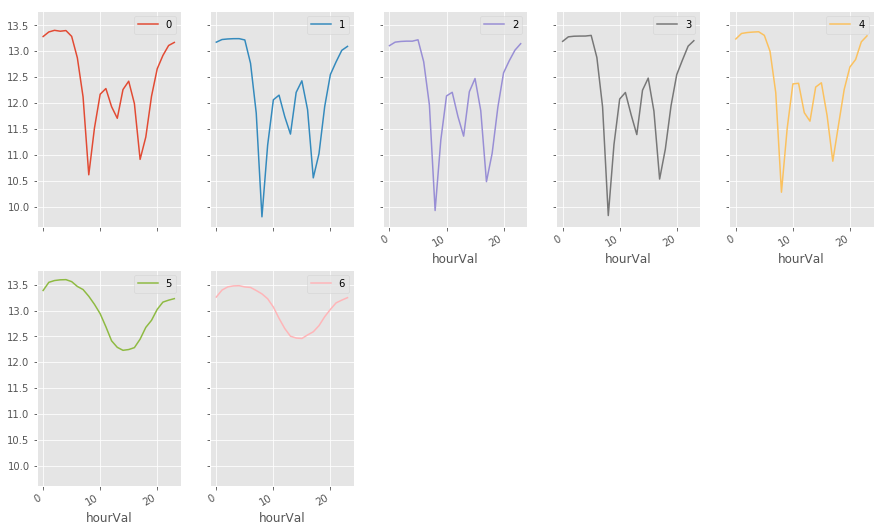

In [41]:
dfPivot.plot(subplots = True, figsize=(15, 15), layout=(3, 5), sharey=True)

In [24]:
df_pboh = df[(df['tfl_id']==43)]

In [25]:
df_pboh.to_csv('2018_portobelloroad.csv', index=True)

In [26]:
df_pboh.info()

<class 'pandas.core.frame.DataFrame'>
Index: 124981 entries, 2018-01-01 00:00:02 to 2018-06-28 16:46:02
Data columns (total 7 columns):
tfl_id          124981 non-null int64
bikes           124981 non-null int64
spaces          124981 non-null int64
total_docks     124981 non-null int64
deposit         124981 non-null int64
deposit_lag     124981 non-null int64
deposit_flag    124981 non-null int64
dtypes: int64(7)
memory usage: 7.6+ MB


In [29]:
df_pboh['hourVal'] = pd.DatetimeIndex(df_pboh.index).hour

/Users/neil/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [30]:
df_pboh['dayVal'] = pd.DatetimeIndex(df_pboh.index).day

/Users/neil/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [28]:
df_pboh['dowVal'] = pd.DatetimeIndex(df_pboh.index).dayofweek

/Users/neil/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [31]:
df_pboh.head(2)

,tfl_id,bikes,spaces,total_docks,deposit,deposit_lag,deposit_flag,dowVal,hourVal,dayVal
timestamp,,,,,,,,,,
2018-01-01 00:00:02,43,3,27,30,3,3,0,0,0,1
2018-01-01 00:02:02,43,3,27,30,0,3,0,0,0,1


In [32]:
df_pbohPivot = pd.pivot_table(df_pboh, values = "bikes", 
                             columns = "tfl_id", index = "hourVal")

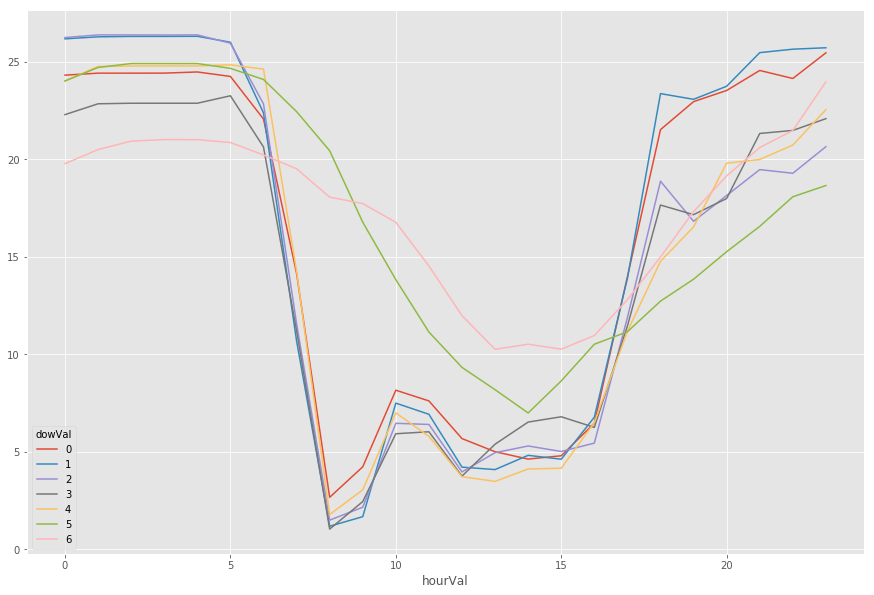

In [33]:
df_pbohPivot.plot()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x108453908>,
      dtype=object)

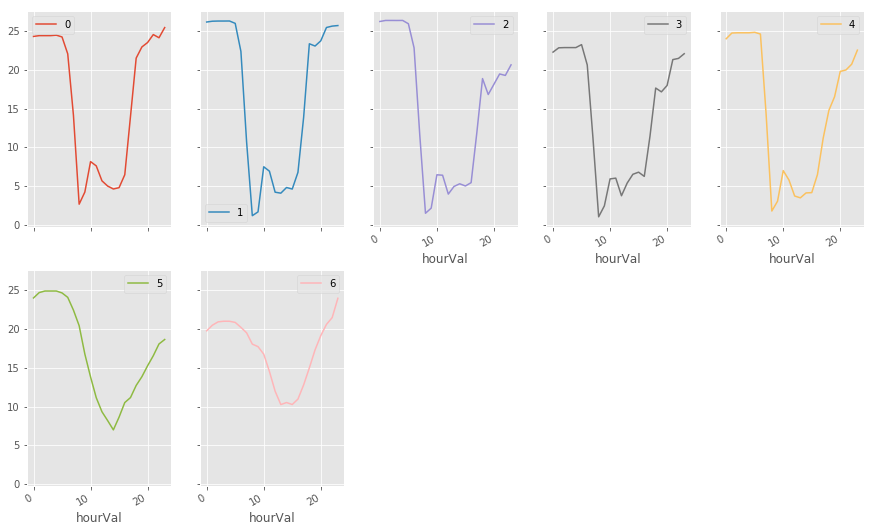

In [34]:
df_pbohPivot.plot(subplots = True, figsize=(15, 15), layout=(3, 5), sharey=True)

In [170]:
names = pd.read_csv('176-01-bikelocations.csv')

In [171]:
names.head(2)

,system,ucl_id,operator_intid,operator_altid,operator_name,operator_desc,lat,lon,initial_bikes,initial_size,curr_bikes,curr_size,created_dt,updated_dt,updated_dt_nonzerobikes,operator_status,operator_installflag,operator_lockflag,operator_tempflag
0,dublinalt,1,0,0,CHATHAM STREET,NaN,53,-6,0,29,23,31,2015-01-12 21:14:02,2017-05-10 10:40:02,2017-05-10 10:40:02,NaN,0,0,0
1,dublinalt,1,0,0,CLARENDON ROW,NaN,53,-6,23,31,17,31,2017-05-10 10:42:01,2018-06-28 16:48:02,2018-06-28 16:48:02,NaN,0,0,0


In [185]:
df_scatter = df[df['deposit']<-5]

In [186]:
import seaborn as sns

AttributeError: module 'seaborn' has no attribute 'plot'

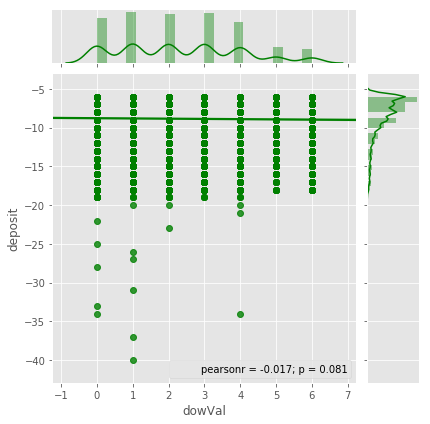

In [188]:
sns.jointplot(data=df_scatter, x='dowVal', y='deposit', kind='reg', color='g')
sns.plot.show()

AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
some problem
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)


/Users/neil/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
A

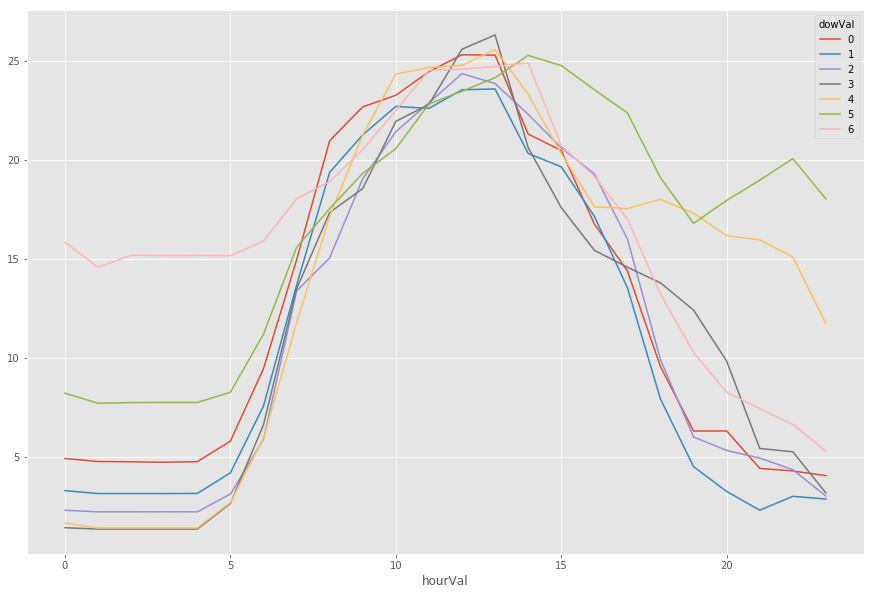

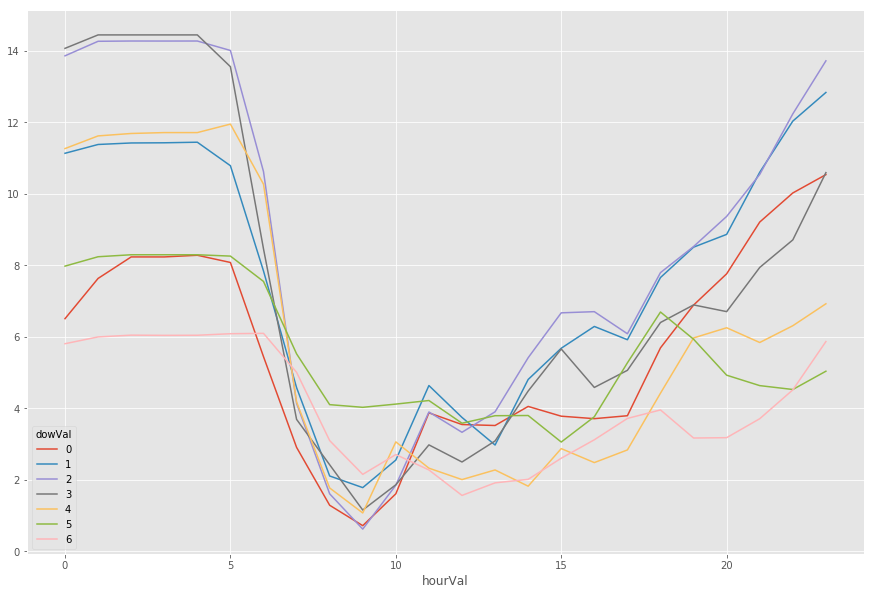

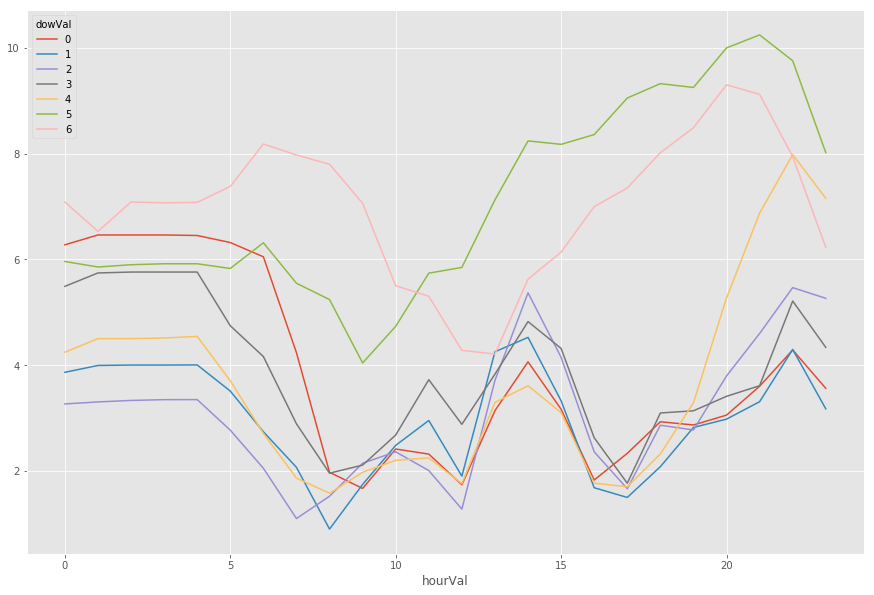

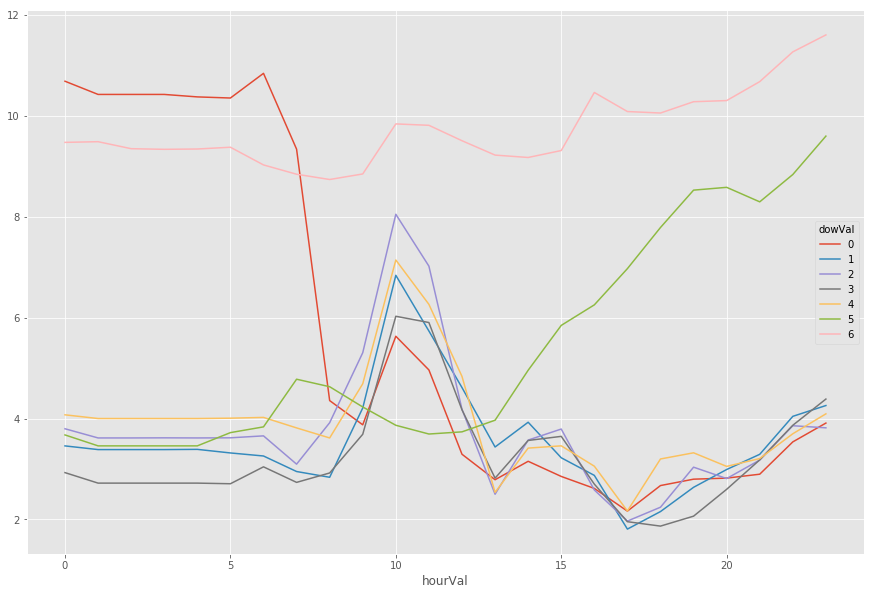

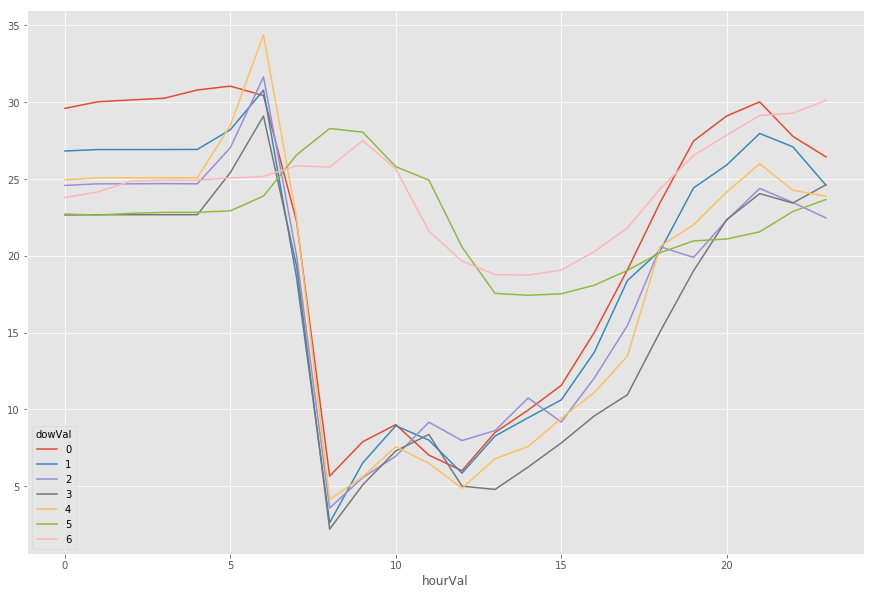

...

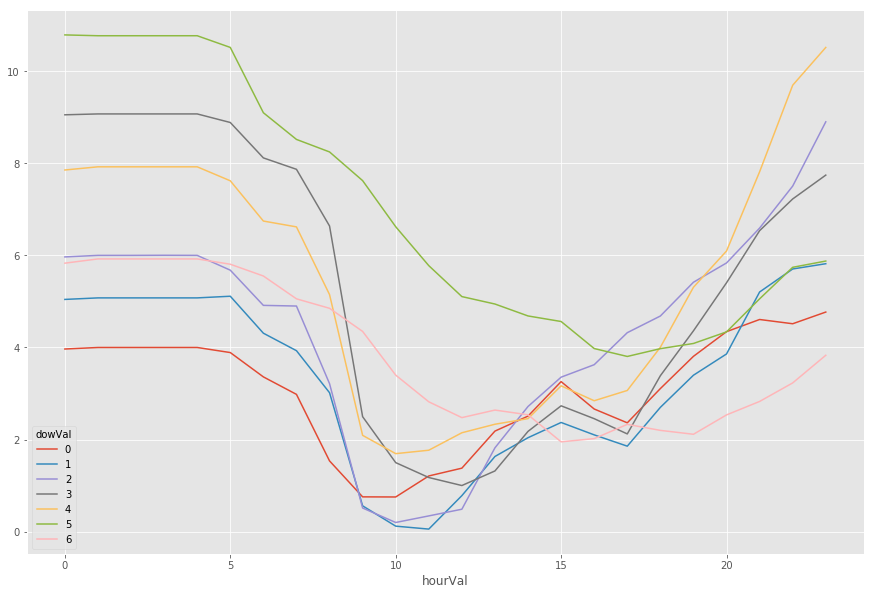

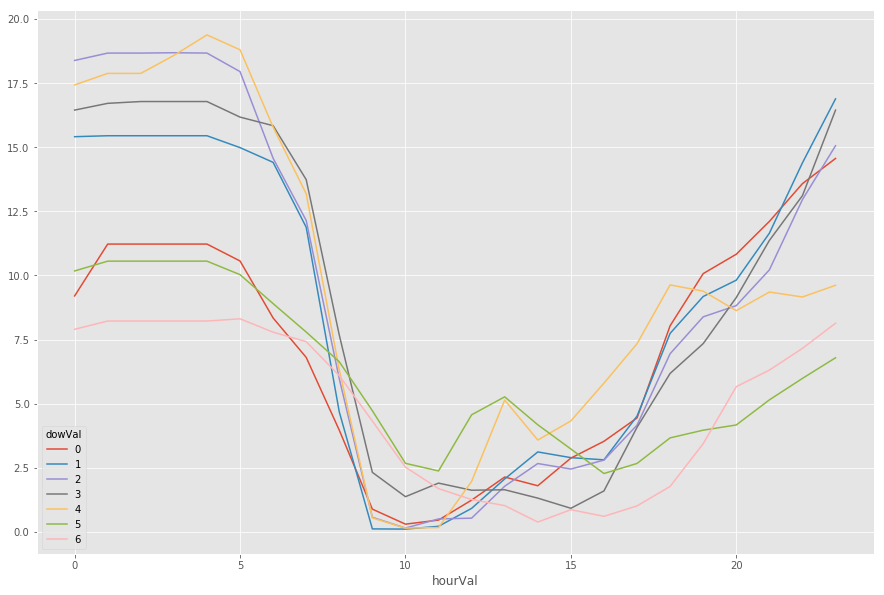

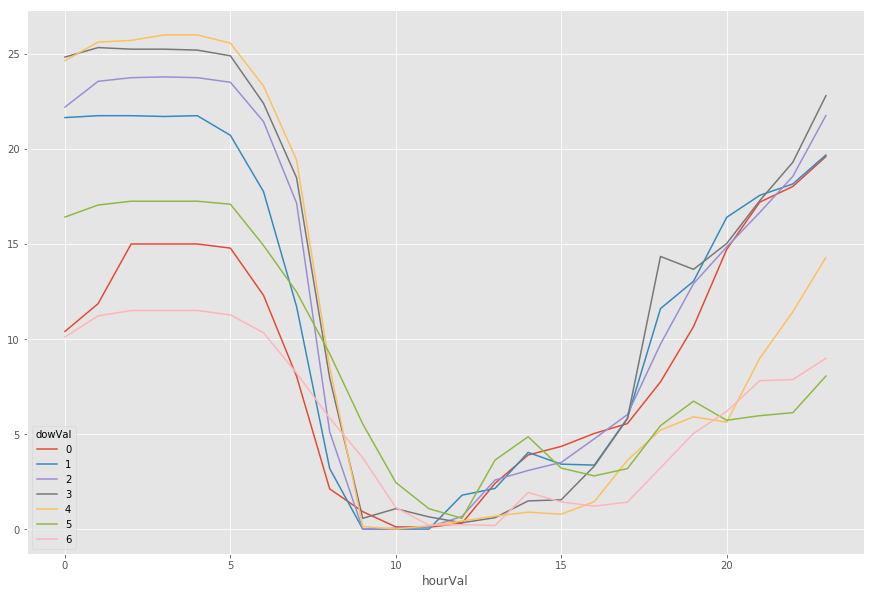

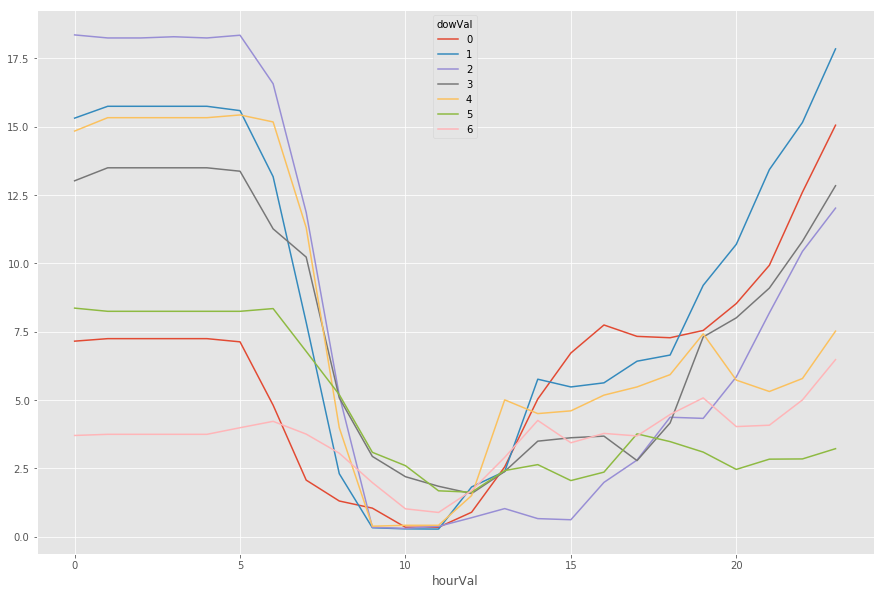

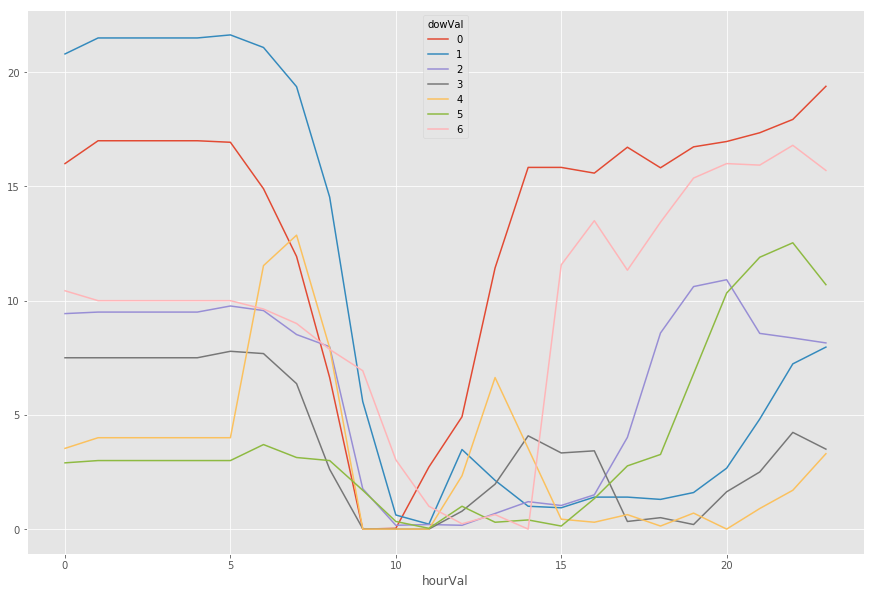

In [168]:
import time
for i in range(0,110):
    try:
        x = df[(df['tfl_id']==i+1)]
        x = pd.pivot_table(x, values = "bikes", 
                                 columns = "dowVal", index = "hourVal")
        print(x.plot())
    except:
        print("some problem with tfl_id: " +str(i))

In [52]:
df_sirpat = df[(df['tfl_id']==5)]

In [93]:
df_sirpatPivot = pd.pivot_table(df, values = "bikes", 
                             columns = "dowVal", index = "hourVal")

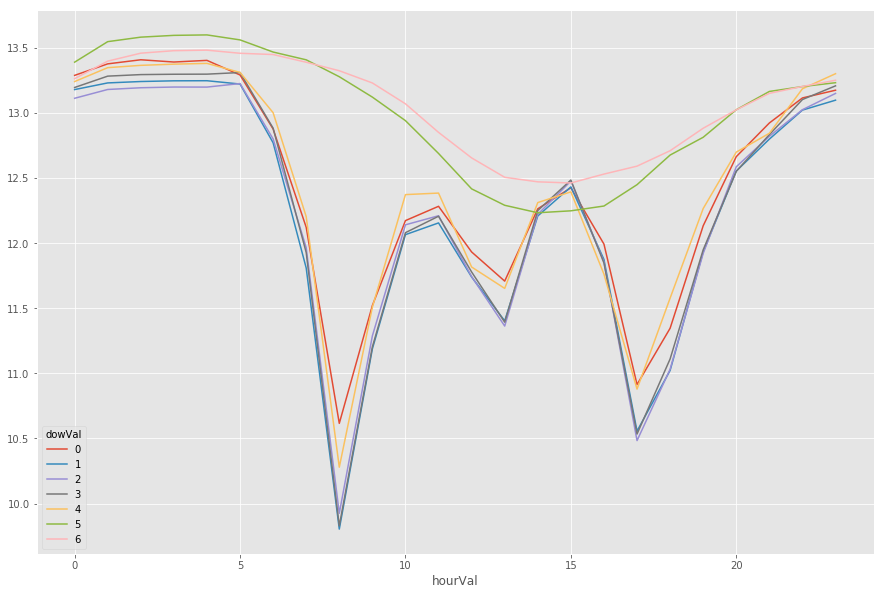

In [94]:
df_sirpatPivot.plot()

In [55]:
df_sirpatPivot.head(24)

dowVal,0,1,2,3,4,5,6
hourVal,,,,,,,
0,24,26,26,22,24,24,20
1,24,26,26,23,25,25,21
2,24,26,26,23,25,25,21
3,24,26,26,23,25,25,21
4,24,26,26,23,25,25,21
5,24,26,26,23,25,25,21
6,22,22,23,21,25,24,20
7,14,11,12,11,14,22,20
8,3,1,1,1,2,20,18


In [56]:
import time

In [ ]:
#df_pivotstationplots.avg()

In [79]:
df_pivotstationplots = pd.pivot_table(df, values = "bikes", 
                             columns = "tfl_id", index = "hourVal")

In [163]:
df_#pivotstationplots = df_pivotstationplots.reindex(df_pivotstationplots['tfl_id'].sort_values(by=df_pivotstationplots.mean(), ascending=False).index)

NameError: name 'df_' is not defined

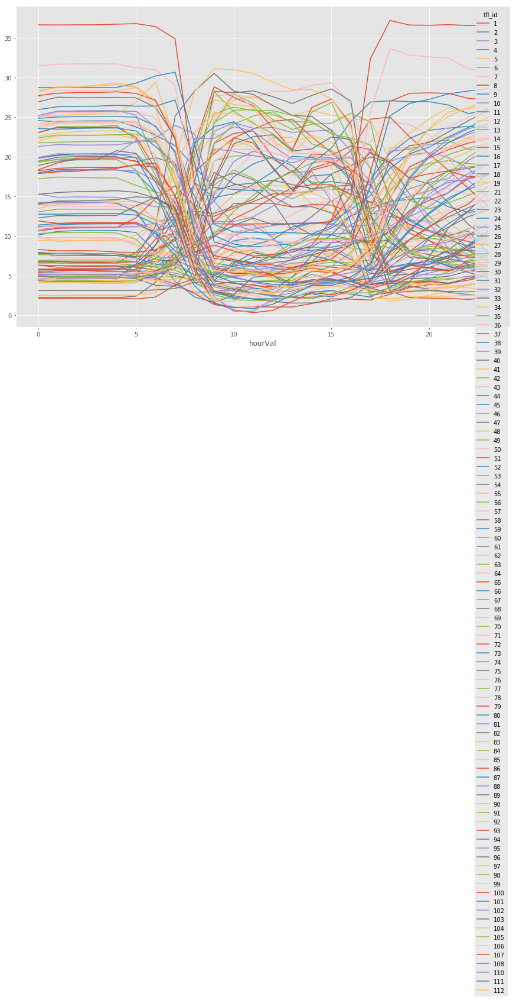

In [65]:
df_pivotstationplots.plot()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x120941f60>,
      dtype=object)

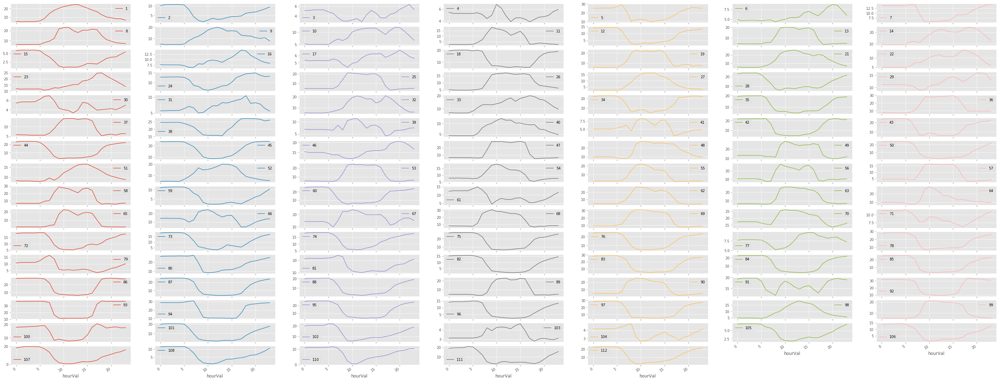

In [72]:
df_pivotstationplots.plot(subplots = True, figsize=(50, 50), layout=(38, 7), sharey=False)

In [74]:
color = dict(boxes='DarkGreen', whiskers='DarkOrange', medians='DarkBlue', caps='Gray')

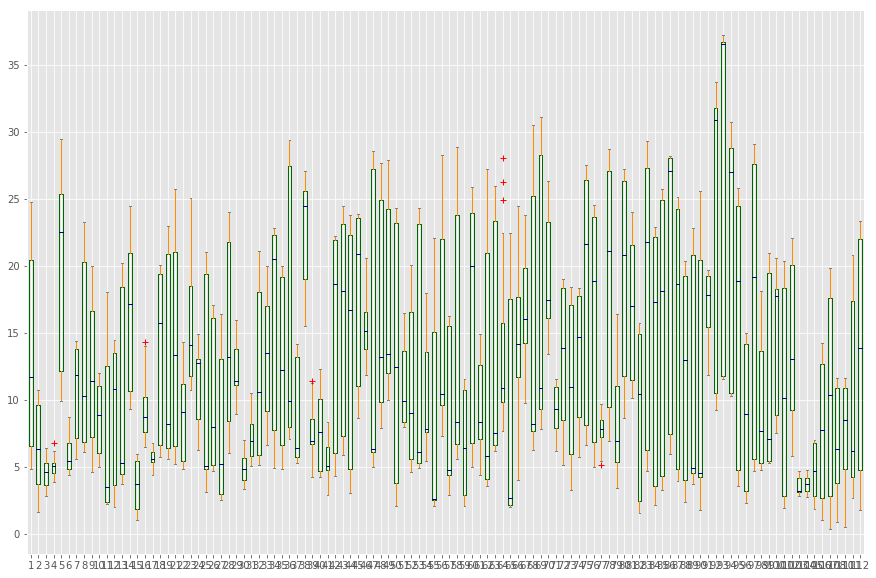

In [75]:
df_pivotstationplots.plot.box(color=color, sym='r+')

In [76]:
df_pivotyplots = pd.pivot_table(df, values = "bikes", 
                             columns = "tfl_id", index = "dowVal")

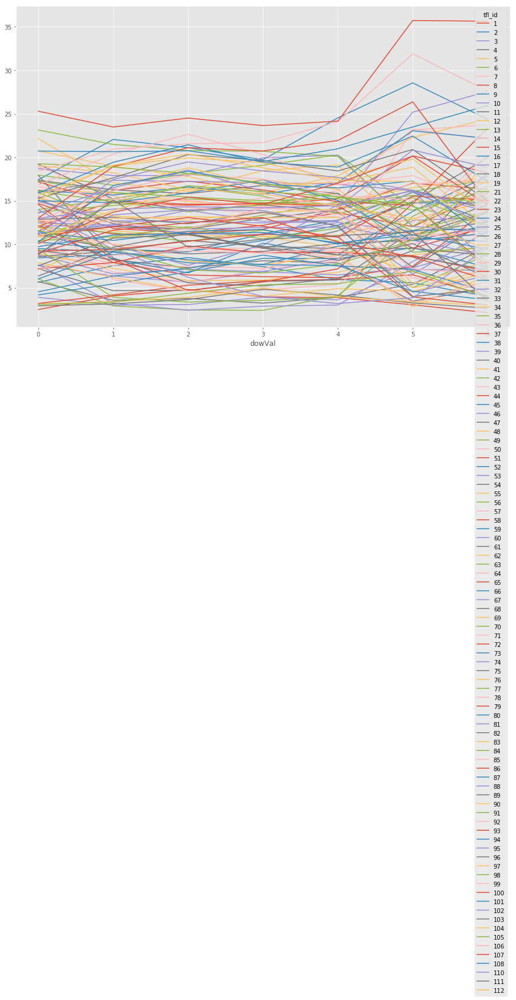

In [77]:
df_pivotyplots.plot()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x127a997b8>,
      dtype=object)

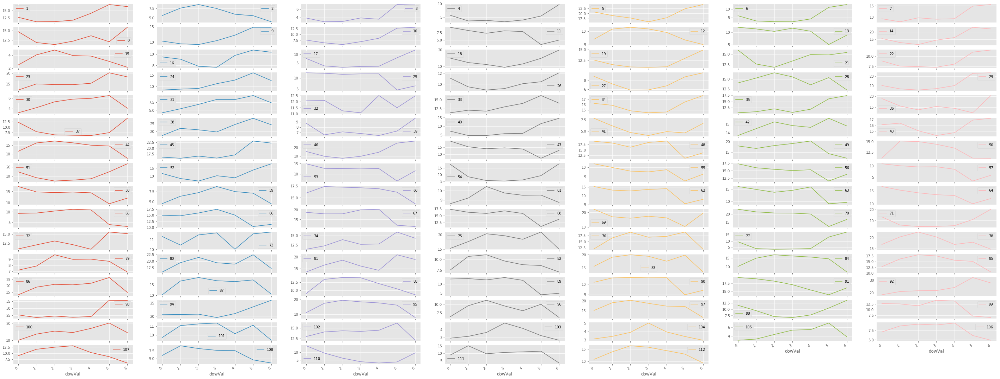

In [78]:
df_pivotyplots.plot(subplots = True, figsize=(50, 50), layout=(38, 7), sharey=False)

In [101]:
df.head(2)

,tfl_id,bikes,spaces,total_docks,deposit,deposit_lag,deposit_flag,hourVal,dowVal
timestamp,,,,,,,,,
2018-01-01 00:00:02,1,18,13,31,0,18,0,0,0
2018-01-01 00:00:02,19,15,15,30,9,15,1,0,0


In [102]:
df = df.drop('deposit_flag', axis=1)

In [103]:
df = df.drop('total_docks', axis=1)

In [104]:
x = df.pop('deposit')

In [106]:
df['deposit'] = x

In [108]:
df.head(2)

,tfl_id,bikes,spaces,deposit_lag,hourVal,dowVal,deposit
timestamp,,,,,,,
2018-01-01 00:00:02,1,18,13,18,0,0,0
2018-01-01 00:00:02,19,15,15,15,0,0,9


In [111]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

In [99]:
mdl = RandomForestRegressor(n_estimators=50, n_jobs=-1, random_state=0)

In [155]:
X = df.drop('deposit',axis=1)
y = df['deposit']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [156]:
X_train.head(2)

,tfl_id,bikes,spaces,deposit_lag,hourVal,dowVal
timestamp,,,,,,
2018-02-12 07:14:03,43,17,13,17,7,0
2018-03-21 03:20:02,60,30,0,30,3,2


In [157]:
y_train.head(2)

timestamp
2018-02-12 07:14:03   -2
2018-03-21 03:20:02    0
Name: deposit, dtype: int64

In [114]:
y_test.head(2)

timestamp
2018-06-21 05:14:02    0
2018-04-05 14:40:02    0
Name: deposit, dtype: int64

In [158]:
mdl.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=50, n_jobs=-1,
           oob_score=False, random_state=0, verbose=0, warm_start=False)

In [159]:
mdl_pred = mdl.predict(X_test)

In [165]:
print('Liner Regression R squared: %.4f' % mdl.score(X_test, y_test))

Liner Regression R squared: -0.0317


In [167]:
print(X_test.columns)
print(mdl.feature_importances_)

Index(['tfl_id', 'bikes', 'spaces', 'deposit_lag', 'hourVal', 'dowVal'], dtype='object')
[0.17661191 0.13152932 0.20792532 0.12965615 0.11248104 0.24179626]


In [147]:
X_test.to_csv('dsddd.csv')

In [148]:
#pbohtest = mdl.predict(test)

In [164]:
import numpy as np
from sklearn.metrics import mean_squared_error
mdl_mse = mean_squared_error(mdl_pred, y_test)
mdl_rmse = np.sqrt(mdl_mse)
print('Liner Regression RMSE: %.4f' % mdl_rmse)

Liner Regression RMSE: 0.6416


In [122]:
from sklearn import ensemble
from sklearn.ensemble import GradientBoostingRegressor
model = ensemble.GradientBoostingRegressor()
model.fit(X_train, y_train)

GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='ls', max_depth=3, max_features=None,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_samples_split=2, min_weight_fraction_leaf=0.0,
             n_estimators=100, presort='auto', random_state=None,
             subsample=1.0, verbose=0, warm_start=False)

In [123]:
print('Gradient Boosting R squared": %.4f' % model.score(X_test, y_test))

Gradient Boosting R squared": 1.0000


In [124]:
y_pred = model.predict(X_test)
model_mse = mean_squared_error(y_pred, y_test)
model_rmse = np.sqrt(model_mse)
print('Gradient Boosting RMSE: %.4f' % model_rmse)

Gradient Boosting RMSE: 0.0025


In [162]:
feature_labels = np.array(df.columns)
importance = mdl.feature_importances_
feature_indexes_by_importance = importance.argsort()
for index in feature_indexes_by_importance:
    print('{}-{:.2f}%'.format(feature_labels[index], (importance[index] *100.0)))

hourVal-11.25%
deposit_lag-12.97%
bikes-13.15%
tfl_id-17.66%
spaces-20.79%
dowVal-24.18%


In [17]:
x = df[df['tfl_id']==34]

In [20]:
x.std()

tfl_id          0.000000e+00
bikes           9.840909e+00
spaces          9.822660e+00
total_docks     3.552998e-15
deposit         1.160731e+00
deposit_2       1.861359e+00
deposit_lag     9.841446e+00
deposit_flag    4.891537e-02
dtype: float64